<a href="https://colab.research.google.com/github/uol-mediaprocessing/group-projects-make-it-aesthetic/blob/master/MakeItAesthetic_HohmannKringLindanis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Make it Aesthetic!

![alt text](https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Titel_Collage.jpg)






## Table of Content

1 Introduction

2 Goals

2.1 Samples and Criteria

2.2 Product

3 Theory and Methods

3.1 Rule of Thirds in Theory

3.2 How to Get There - A Process Pipeline

4 Process and Implementation

4.1 Basic Functions

4.2 Horizon Detection

4.2.1 Detect Lines With HoughLines Transformation

4.2.2 Crop the Image

4.2.3 Applications to Other Images

4.3 Salient Object Detection

4.3.1 Detect Salient Objects - First Approach

4.3.2 Detect Salient Objects - Second Approach

4.3.3 Detect Salient Object With PoolNet

4.3.4. Crop the Image

4.3.5 Applications to Other Images

5 Limitations and Visions

6 Reflections and Conclusions

7 References

##1. Introduction
The project "Make it aesthetic" of the module Media Processing of the University of Oldenburg serves to make already shot photos more vivid.

A lot of people take photos to capture certain situations or to capture a particularly beautiful moment in nature, such as a sunset.

Almost everyone nowadays takes photos, but not everyone observes certain guidelines that a professional photographer, for example, would follow. In order to make it possible for amateur photographers to align their shot pictures according to the guidelines, we want to develop an algorithm in our project, which cuts and aligns the pictures according to certain guidelines. To reach this goal it is necessary to define the guidelines of an aesthetic photo and to define which object is the main object of the photo.

##2. Goals
We are interested in (professional) photography and take a lot of photos in our leisure time. Not everyone (including us) knows all the guidelines for taking aesthetic photos and invests time in learning the guidelines and how to apply them. Nevertheless we all want to take beautiful and aesthetic photos. This is where we want to start: We want to make aesthetic photography accessible to everyone by simplifying the way to an aesthetic photo for the user. But it is not our aim to tell the user how to take a aesthetic photo but offering him and her a tool to generate a aesthetic photo out of a photo that do not follows the rules of aesthetic photography (see chapter 3 for a more detailed description). With our algorithm everybody should be able to capture every moment in a beautiful, aesthetic photo. 

In order to achieve this goal, we want to edit and align the images by zooming, rotating and cropping according to the guidelines of aesthetic photography.

###2.1 Samples and Criteria
In our project we decided to distinguish two fields: on one hand images with lines like landscape or buildings and on the other hand images with objects like flowers, portraits, and creatures. The pictures we chose to develop and test our algorithm should not be too complex. That means they should have a clear color contrast. For example the background is bright and the object is dark (image 1) or vice versa (image 2).


With regard to images with objects, there should be only one object that needs to be aligned, and this object should be larger than the other objects in the image. For all images it is necessary that the salient regions are sharp. The background may be blurred. These criteria you can see in the sample images 1 and 2.

> ![alt text](https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/SamplesANDCriteria_object.jpg)

Furthermore especially the landscapes and buildings should have strong and clear lines.


> ![alt text](https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Samples_lines.jpg)

###2.2 Product
On the one hand, the algorithm implemented by us is used to have certain images, such as beach images from a holiday, aligned with a horizon according to the rule of third. On the other hand, the user can have individual objects aligned on the images so that this alignment also complies with the rule of third. The Rule of Third is discussed in more detail in the next chapter.

##3. Theory and Methods
To make pictures look more aesthetic, there are many different guidelines that can be followed to follow certain rules such as the Golden Cut or the Diagonal Dominance. In this project we focus on the Rule of Third.

###3.1 Rule of Thirds in Theory

###3.2 How to get there - A Process Pipeline

##4. Process and Implementation

###4.1 Basic Functions

The following packages are imported for specific reasons:
* **NumPy**: NumPy is a program library for the programming language Python, which allows an easy handling of vectors, matrices or generally large multidimensional arrays
* **cv2**: OpenCV is a free program library with algorithms for image processing and machine vision 
* **argparse**: The argparse module makes it easy to write user-friendly command-line interfaces
* **skimage**: The main package of skimage only provides a few utilities for converting between image data types
* **io**: Reading, saving, and displaying images and video
* **scipy.optimize**: SciPy optimize provides functions for minimizing (or maximizing) objective functions, possibly subject to constraints. It includes solvers for nonlinear problems (with support for both local and global optimization algorithms), linear programing, constrained and nonlinear least-squares, root finding and curve fitting
* **fsolve**: Find the roots of a function
* **matplotlib**: Matplotlib is a program library for the programming language Python, which allows to create mathematical representations of any kind
* **pyplot**: matplotlib.pyplot is a collection of command style functions that make matplotlib work like MATLAB
* **PIL**: Python Imaging Library (abbreviated as PIL) (in newer versions known as Pillow) is a free library for the Python programming language that adds support for opening, manipulating, and saving many different image file formats
* **Image**: The Image module provides a class with the same name which is used to represent a PIL image
* **ImageDraw**: The ImageDraw module provide simple 2D graphics for Image objects

In [0]:
import numpy as np
import cv2
import argparse
from skimage import io
from scipy.optimize import fsolve
from matplotlib import pyplot as plt
from PIL import Image
from PIL import Image, ImageDraw
import math
# import Pytorch for saliency detection with DeepL
import torch
import torchvision

In [0]:
def load_image(name):
  image = cv2.imread(name) # loads picture from disk
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # corrects color of image
  return image

In [0]:
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/flower.JPEG
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Taj_Mahal.jpg

In this project we want to focus on the **Rule of Third (RT)**. 

The first step to work with the Rule of Third is to find out how big the scanned images are in the x-axis (width of image) and in the y-axis (height of image). That happens with the ```shape``` function. The shape of an image is accessed by ```img.shape```. It returns a tuple of the number of rows, columns, and channels (if the image is color). Height is at index 0, width is at index 1; and number of channels at index 2. To calculate the first line for the RT it divides the height (resp. the width) of the photo by 3. Therefore the "//" operator is used since we need integer values for the further processing. For the second horizontal line the height is divided by 3 too but now the result is multiplied by 2. Similarly for the vertical line.

In [0]:
def generate_image_data(img):
  height = img.shape[0]
  width = img.shape[1]

  #calulating the lines for the rule of thirds
  third_of_height_1 = height // 3
  third_of_height_2 = (height // 3) * 2
  third_of_width_1 = width // 3
  third_of_width_2 = (width // 3) * 2
  return width, height, third_of_height_1, third_of_height_2, third_of_width_1, third_of_width_2


**Calculation of the lines of interest**

The following function called ```draw_rule_of_thirds``` is used to draw the lines of the *Rule of Thirds* (RT) on the given photo. The function requires an object of type *img* and it returns an object of type *img*.

After the preprocessing in the ```generate_image_data``` function we have all information to draw the RT-lines. Therefore we use the ```cv2.line``` function from *OpenCV* for the horizontal lines and the vertical lines. We decided to use this function instead of the functions provided by *matplotlib* because we would like to show multiple images at the same time later on in the project to be able to compare images with each other. When we used the ```plt.axhlines``` resp. ```plt.axvlines``` from *matplotlib* ([1]) we get all lines in one image but not in the images we wanted. To draw the lines with the ```cv2.line``` function we calculate the line thickness according to the size of the image and we use the ```CV_AA``` as line type to draw all lines with the same thickness. 

Since we have images with different colours we have to draw the RT-lines in black or white depending on the average colour of the picture. To determine the average colour we add up all pixels of the gray version of the image and divide the sum by total amount of pixels of the image matrix.



At the end the function returns the photo with the RT-lines on it. The RT-lines are shown in a different layer as the image is shown because we do not want to have the line in the image later on.


In [0]:
def draw_rule_of_thirds(img):
  img = img.copy()
  #calulating the height and width of the image and the lines for the rule of thirds
  width, height, third_of_height_1, third_of_height_2, third_of_width_1, third_of_width_2 = generate_image_data(img)

  #calculating the average_brightness of the image
  img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  average_brightness = img_gray.sum() // (len(img_gray)*len(img_gray[0]))
 
  black = (0,0,0)
  white = (255,255,255)
  thickness = max(width, height) // 200 
  #define the line color in dependence of the brightness
  if average_brightness >= 129:
    #drawing the lines on the photo calculated above
    #drawing the horizontal lines
    cv2.line(img, (0, third_of_height_1), (width, third_of_height_1), black, thickness=thickness, lineType=cv2.LINE_AA)
    cv2.line(img, (0, third_of_height_2), (width, third_of_height_2), black, thickness=thickness, lineType=cv2.LINE_AA)
    
    #drawing the vertical lines  
    cv2.line(img, (third_of_width_1, 0), (third_of_width_1, height), black, thickness=thickness, lineType=cv2.LINE_AA)
    cv2.line(img, (third_of_width_2, 0), (third_of_width_2, height), black, thickness=thickness, lineType=cv2.LINE_AA)
  
  else:
    #drawing the lines on the photo calculated above
    #drawing the horizontal lines
    cv2.line(img, (0, third_of_height_1), (width, third_of_height_1), white, thickness=thickness, lineType=cv2.LINE_AA)
    cv2.line(img, (0, third_of_height_2), (width, third_of_height_2), white, thickness=thickness, lineType=cv2.LINE_AA)

    #drawing the vertical lines
    cv2.line(img, (third_of_width_1, 0), (third_of_width_1, height), white, thickness=thickness, lineType=cv2.LINE_AA)
    cv2.line(img, (third_of_width_2, 0), (third_of_width_2, height), white, thickness=thickness, lineType=cv2.LINE_AA)

  return img

To be able to display multiple images at the same time, the ```plot``` function was created. It gets the images and the corresponding image titles that are to be displayed.  

In [0]:
def plot(images, titles, cols = None, show_ticks = False):
  if cols is None:
    cols = min(len(images), 3)
  
  rows = math.ceil(len(images) / cols)

  for i in range(len(images)):
    plt.subplot(rows, cols, i+1)
    plt.imshow(images[i], 'gray')
    plt.title(titles[i])

    if not show_ticks:
      plt.xticks([])
      plt.yticks([])
  
  # FIXME: adjusts the subplots with respect ratio of the first image but needs some tunings
  first_image = images[0]
  height = first_image.shape[0]
  width = first_image.shape[1]
  aspect_ratio =  width / height
  is_landscape= aspect_ratio > 1
  if is_landscape :
    plt.subplots_adjust(left=0, bottom=0, right=3, top=2)
  is_portrait= aspect_ratio < 1
  if is_portrait:
    plt.subplots_adjust(left=0, bottom=0, right=2, top=3)
  is_square_format = aspect_ratio == 1
  if is_square_format:
   plt.subplots_adjust(left=0, bottom=0, right=3, top=3)

  plt.show()
  return


To see the result of the preprocessing, all the functions from above are combined to one function:

In [0]:
def preprocessing(img_name):
  img = load_image(img_name)
  width, height, third_of_height_1, third_of_height_2, third_of_width_1, third_of_width_2 = generate_image_data(img)
  print('width =', width)
  print('height =', height)
  print('vertical lines:', '1st line =', third_of_width_1, ', 2nd line =', third_of_width_2)
  print('horizontal lines:', '1st line =', third_of_height_1, ', 2nd line =', third_of_height_2)
  print('')
  img_with_rtLines = draw_rule_of_thirds(img)
  titles = ['Original Image', 'Image with RT-Lines']
  images = [img, img_with_rtLines]
  plot(images, titles)

This function was written for demonstration purposes only and is not used in the project later on. 

By using this method, the preprocessing can be seen in an example. In the first example the RT-lines are white because the background is almost black.

width = 6016
height = 4000
vertical lines: 1st line = 2005 , 2nd line = 4010
horizontal lines: 1st line = 1333 , 2nd line = 2666



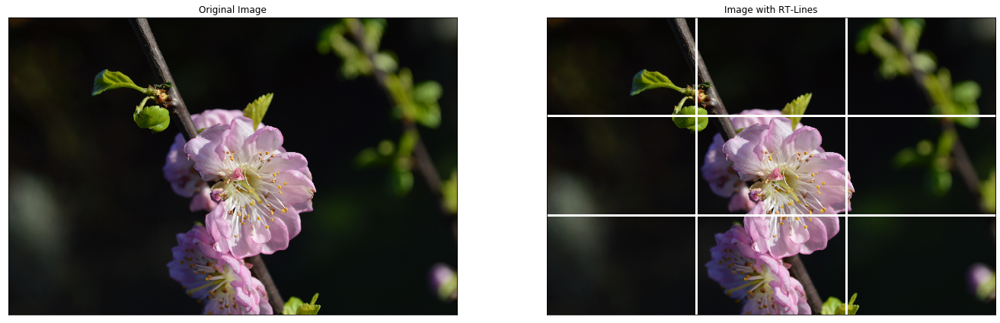

In [87]:
preprocessing('flower.JPEG')

In the second example, the lines are black because the average color is bright due to the light blue sky and the white Taj Mahal. 

width = 2592
height = 1944
vertical lines: 1st line = 864 , 2nd line = 1728
horizontal lines: 1st line = 648 , 2nd line = 1296



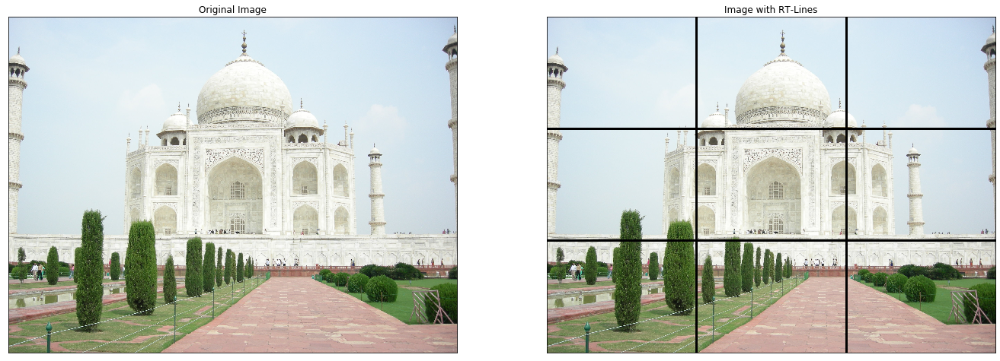

In [88]:
preprocessing('Taj_Mahal.jpg')

###4.2 Horizon Detection

####4.2.1 Detect Lines with HoughLine Transformation

The lines of the Rule of Third serve as orientation to align certain features in the photo with it. So for example also the horizon. We want to achieve to recognize the horizon and then align it with the lines of interest.

In the function ```process_img``` the image is loaded again with the function ```generate_image_data``` with all values calculated in the function. In ```vertices```, the area to be ignored when the horizon is detected is specified. This area is located above the upper line of interest and below the lower line of interest.

Then the ```processed_img``` is generated. It is generated with the function ```roi``` which stands for **Region of Interest**. This function gets the image and the vertices as parameters.

First, an empty mask is created with ```np.zeros_like```. The mask is filled with ```cv2.fillPoly```. This function gets the empty mask passed as an image, the vertices and the color with which the polygonal area resulting from the vertices should be filled. In this case it is white. The photo and the filled mask are now connected with ```cv2.bitwise_and```. So in the end only what is not white will be displayed.

In [0]:
def roi(img, vertices):
    #blank mask:
    mask = np.zeros_like(img)
    # fill the mask
    cv2.fillPoly(mask, vertices, 255)
    # now only show the area that is the mask
    masked = cv2.bitwise_and(img, mask)
    return masked

def process_img(img):
    height, width, third_of_height_1, third_of_height_2, third_of_width_1, third_of_width_2 = generate_image_data(img)

    vertices = np.array([[0,third_of_height_1],[width,third_of_height_1], [width,third_of_height_2],[0,third_of_height_2]], np.int32)
    processed_img = roi(img, [vertices])
    
    return processed_img

In order to be able to recognize the horizon in an image, a copy (**np.copy**) of the image is first created because the original should not be changed. 

A pre-processing of the image must take place so that the horizon can be recognized. At first the image is converted into **grayscale** because less information needs to be provided for each pixel. Then the grayscaled image is filtered with **GaussianBlur** for reducing image noise and details. On the blurred picture we apply the **Canny Algorithm** for extracting useful structural information from different vision objects and dramatically reducing the amount of data to be processed. After that the mask of the function **process_img** is applied.

The next step is to extract a better line of the horizon. This is done with **dilation**. Dilation is a morphological basic operation in digital image processing. 

The **Hough-Transformation** is a robust global method for the recognition of straight lines, circles or any other parameterizable geometric figures in a binary gradient image, i.e. a black-and-white image, after an edge detection. This is used for detecting the horizon. The arguments rho, theta, threshold, min_line_length, max_line_gap and line_image are necessary. We use **HoughLinesP** with probabilities because we can add a **max_line_gap** so that gaps are ignored and we will have a better line. If lines are detected they will be drawn.

In [0]:
def detect_horizon(img):
  img = img.copy()
  #preprocessing of the image to detect lines
  gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
  blur = cv2.GaussianBlur(gray, (9,9),2)
  edges = cv2.Canny(blur,50,150,apertureSize = 3)
  processed_img = process_img(edges)
 
  #dilate and erose the binary image to extract better lines
  kernel = np.ones((2,10),np.uint8)
  dilation = cv2.dilate(processed_img,kernel,iterations = 3)

  #get the width of the image to calculate the minimal length of the line in the
  #image in dependence of the width of the image
  height, width, third_of_height_1, third_of_height_2, third_of_width_1, third_of_width_2 = generate_image_data(dilation)
  
  #define the arguments for the function of the Hough Line Transformation
  rho = 1  # distance resolution in pixels of the Hough grid
  theta = np.pi / 180  # angular resolution in radians of the Hough grid
  threshold = 15  # minimum number of votes (intersections in Hough grid cell)
  min_line_length = int(width*0.05)  # minimum number of pixels making up a line
  max_line_gap = 80  # maximum gap in pixels between connectable line segments
  line_image = np.copy(img) * 0  # creating a blank to draw lines on

  # Run Hough on edge detected image
  # Output "lines" is an array containing endpoints of detected line segments
  lines = cv2.HoughLinesP(dilation, rho, theta, threshold, np.array([]),
                   min_line_length, max_line_gap)
  if lines is not None:
    for line in lines:
      for x1,y1,x2,y2 in line:
        #print(x1,y1,x2,y2)
        #draw the detected lines into the image
        image_line = cv2.line(line_image,(x1,y1),(x2,y2),(255,0,0),10)
        lines_edges = cv2.addWeighted(img, 0.8, line_image, 1, 0)
    
    horizon = aggregate_to_horizon(lines)
    return img, edges, dilation, image_line, lines_edges, lines, horizon
  else: #if no lines are detected
    print("Konnte leider keine Linien erkennen.") 

def aggregate_to_horizon(lines): 
  horizon = math.inf
  for line in lines:
    line = line[0]
    begin_x = line[0]
    begin_y = line[1]
    end_x = line[2]
    end_y = line[3]

    gradient = (begin_y - end_y) / (begin_x - end_x) 

    is_flat_enough = abs(gradient) < 0.1 

    if is_flat_enough:
      if begin_y < horizon:
        horizon = begin_y
      if end_y < horizon:
        horizon = end_y 

  return horizon

In [0]:
def get_Coordinates_of_horizon(lines):
  start_point = tuple(lines[0][0],lines[0][1])
  last_row, last_column = lines.shape
  print(last_row)
  end_point = tuple(lines[n][2],lines[n][3])

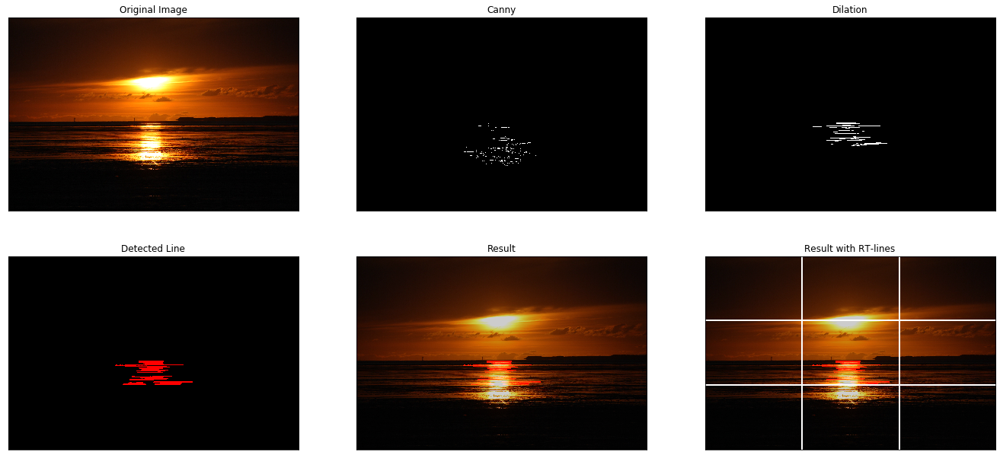

In [92]:
# show_detected horizon
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Horizon/Sunset/IMG_1359.JPG

img = load_image('IMG_1359.JPG')
result, edges, dilation, image_line, lines_edges, lines, horizon = detect_horizon(img)
result_with_rtLines = draw_rule_of_thirds(lines_edges)
titles = ['Original Image', 'Canny',
          'Dilation', 'Detected Line', 'Result', 'Result with RT-lines']
images = [img, edges, dilation, image_line, lines_edges, result_with_rtLines]

plot(images, titles)

####4.2.2 Crop the Image

After the horizon has been recognized, the next step is to align the horizon with the line of interest. To do this, the image must be cropped. This is done with the function ```crop_img```.

In this function the first index of the first array is the first point of detected horizon. Then the distance between the horizon and the second line of interest is calculated. After this step, the first and second cropping point is calculated . To crop the image proportionally, the left and right cropping point of the x axis is calculated at the end.

In [0]:
def crop_img(img):
  img = img.copy()
  width, height, third_of_height_1, third_of_height_2, third_of_width_1, third_of_width_2 = generate_image_data(img)
  img, edges, dilation, image_line, lines_edges, lines, horizon = detect_horizon(img)
      
  #cv2.line(img, (0, horizon), (width, horizon), (255, 0,0), thickness=10, lineType=cv2.LINE_AA)
  upper_horizon_distance = abs(third_of_height_1 - horizon)
  lower_horizon_distance = abs(third_of_height_2 - horizon)
  closer_to_upper_horizon = upper_horizon_distance < lower_horizon_distance

  aspect_ratio = width/height

  top_cropping = 0
  bottom_cropping = 0
  left_cropping = 0
  right_cropping = 0

  if closer_to_upper_horizon:
    top_cropping = int((3/2) * upper_horizon_distance)
  else:
    bottom_cropping = int((3/2) * lower_horizon_distance)
  
  # determine the left and right cropping_point of the x-asis, to crop the picture middle-weight
  new_height = height - top_cropping - bottom_cropping
  new_width = int(new_height * aspect_ratio)
  left_cropping = (width - new_width) // 2 
  right_cropping = left_cropping
    
  cropped_img = img[top_cropping:(height - bottom_cropping), left_cropping:(width - right_cropping)]

  return cropped_img  

In [0]:
def plot_cropped_using_rt(original_img):
  uncropped = original_img
  uncropped_rt = draw_rule_of_thirds(uncropped)
  cropped_img = crop_img(original_img)
  cropped_rt = draw_rule_of_thirds(cropped_img)

  titles = ['Original', 'Original with RT', 'Cropped', 'Cropped with RT']
  images = [img, uncropped_rt, cropped_img, cropped_rt]
  plot(images, titles, 4)
  #return

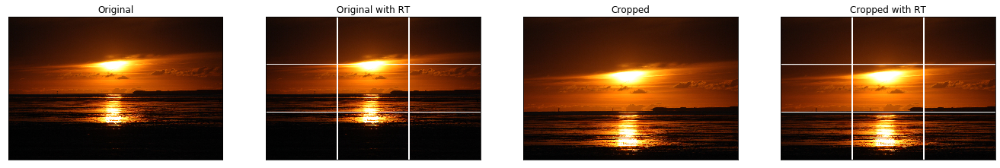

In [95]:
plot_cropped_using_rt(img)

####4.2.3 Application to other Images


> Bilderausgabe: Original, Original RT, Dilation, Rote Linien in Original, Zugeschnitten, Zugeschnitten mit RT 



In [0]:
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/goodhorizon.jpg
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/ex5.JPG
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/ex6.JPG
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/DSCN0053.jpg
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Horizon/Sunset/IMG_1374.JPG
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Horizon/Sunset/IMG_1370.JPG
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Horizon/Sunset/IMG_1363.JPG
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Horizon/Sunset/IMG_1359.JPG
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Horizon/Sunset/IMG_1334.JPG
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Horizon/IMGRom.JPG
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Horizon/IMGBoat.JPG
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Horizon/Snow1.png
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Horizon/IMGSnow2.JPG
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Horizon/IMGSpain1.JPG
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Horizon/IMGSpain2.JPG
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Horizon/IMGSun.JPG
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Horizon/IMGPeople.JPG
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Horizon/IMGDeich.JPG
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Horizon/IMGCastle.JPG

In [0]:
def create_aesthetic_image_with_lines(img_name):
  img = load_image(img_name)
  original_with_rtLines = draw_rule_of_thirds(img)
  # detects the horizon in the image
  result, edges, dilation, image_line, lines_edges, lines, horizon = detect_horizon(img)
  # crops the image according to the calculated values
  cropped_img = crop_img(img)
  cropped_img_with_rtLines = draw_rule_of_thirds(cropped_img)

  # cuts the ending of the file name
  if img_name.find('.jpg') != -1:
    img_name_without_dataformat = img_name.replace('.jpg', '')
  elif img_name.find('.JPG') != -1:
    img_name_without_dataformat = img_name.replace('.JPG', '')
  elif img_name.find('.png') != -1:
    img_name_without_dataformat = img_name.replace('.png', '')
  elif img_name.find('.jpeg') != -1:
    img_name_without_dataformat = img_name.replace('.jpeg', '')
  elif img_name.find('.JPEG') != -1:
    img_name_without_dataformat = img_name.replace('.JPEG', '')

  # save the aesthetic image as result  
  save_aesthetic = cv2.cvtColor(cropped_img, cv2.COLOR_BGR2RGB)
  cv2.imwrite('/content/aesthetic_'+img_name_without_dataformat+'.jpg', save_aesthetic)

  titles = ['Original Image', 'Original With RT-Lines',
            'Dilation', 'Result', 'Cropped Image', 'Cropped Image With RT-Lines']
  images = [img, original_with_rtLines, dilation, lines_edges, cropped_img, cropped_img_with_rtLines]

  plot(images, titles)

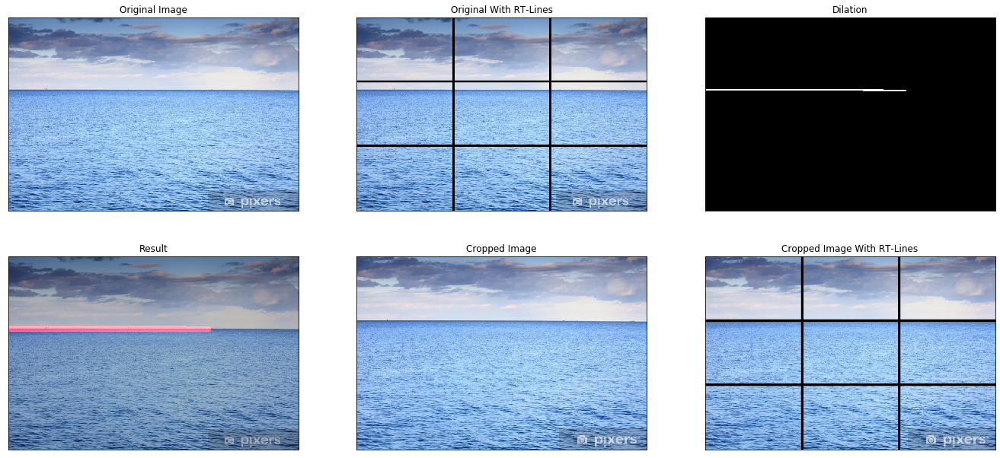

In [0]:
create_aesthetic_image_with_lines('goodhorizon.jpg')

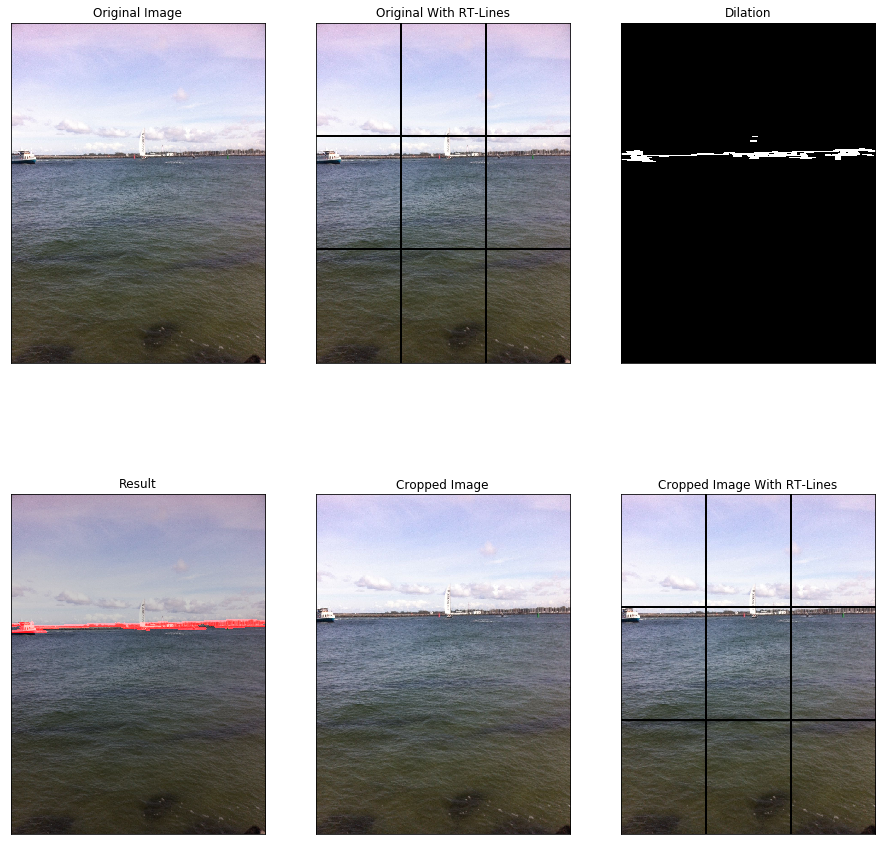

In [0]:
create_aesthetic_image_with_lines('ex5.JPG')

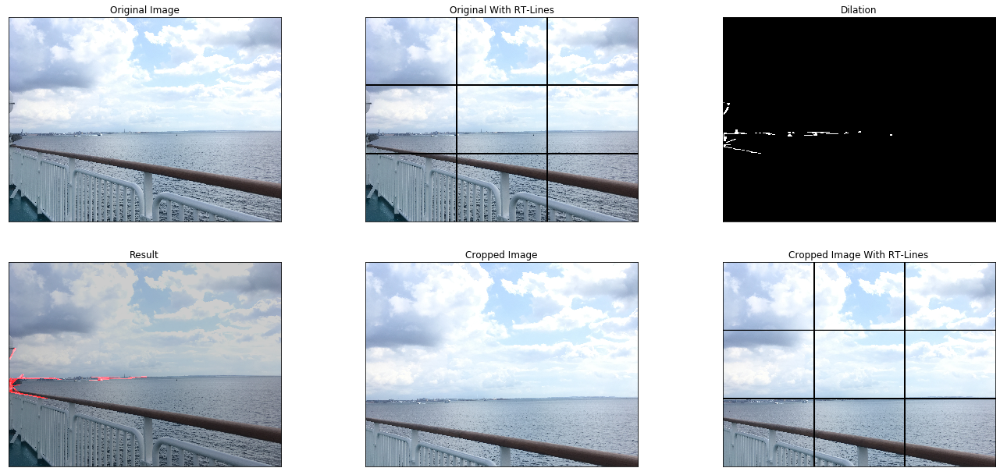

In [0]:
create_aesthetic_image_with_lines('ex6.JPG')

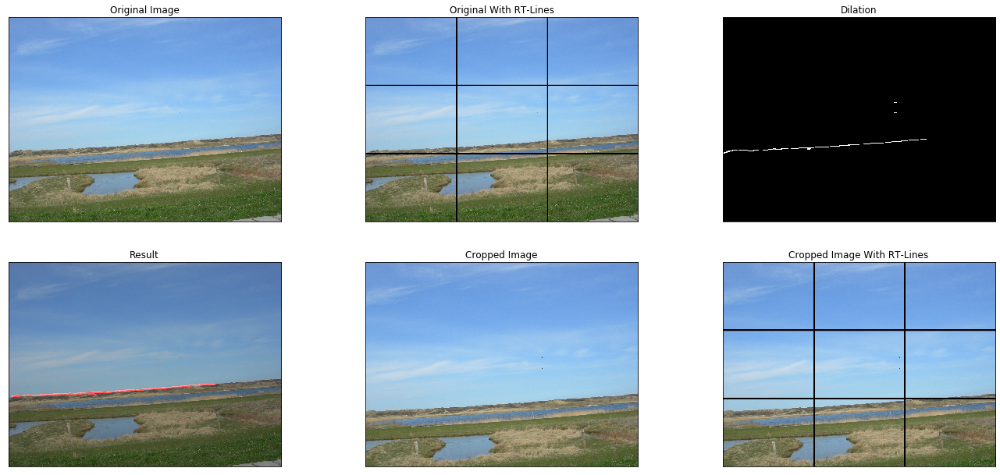

In [0]:
create_aesthetic_image_with_lines('DSCN0053.jpg')

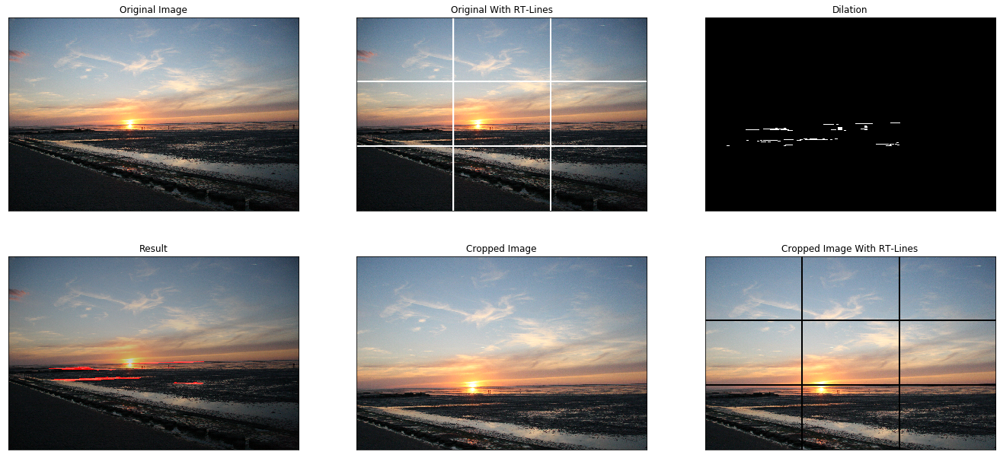

In [0]:
create_aesthetic_image_with_lines('IMG_1374.JPG')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:51: RuntimeWarning: divide by zero encountered in int_scalars


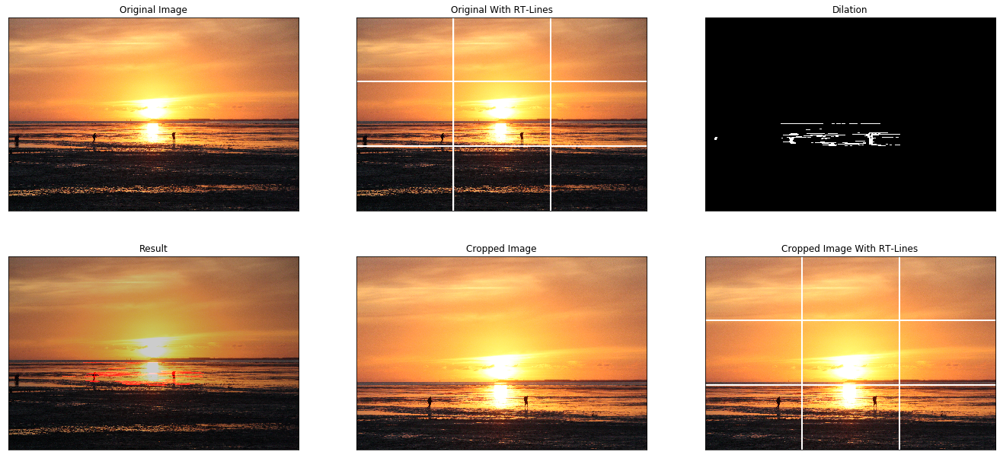

In [0]:
create_aesthetic_image_with_lines('IMG_1370.JPG')

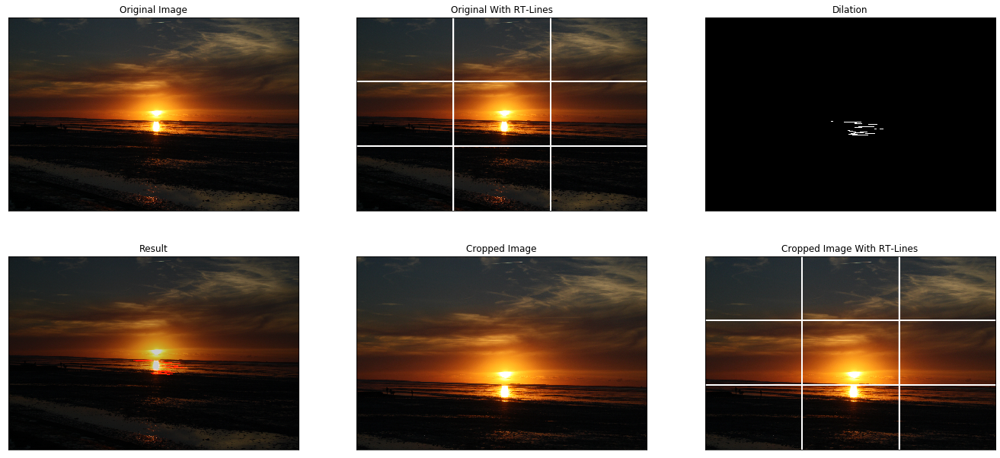

In [0]:
create_aesthetic_image_with_lines('IMG_1363.JPG')

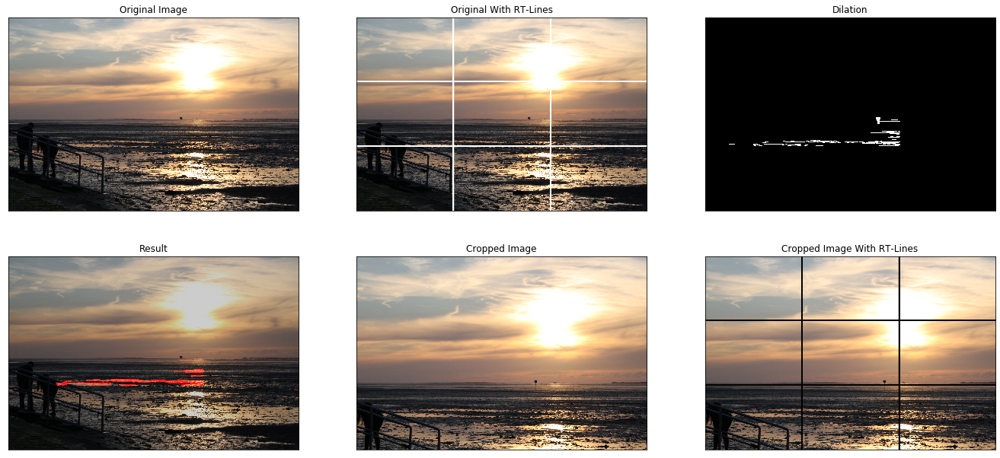

In [0]:
create_aesthetic_image_with_lines('IMG_1334.JPG')

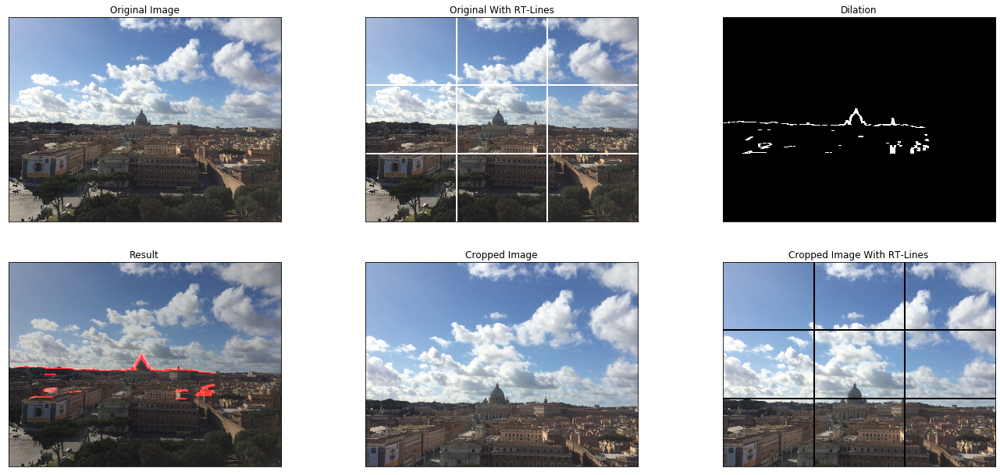

In [0]:
create_aesthetic_image_with_lines('IMGRom.JPG')

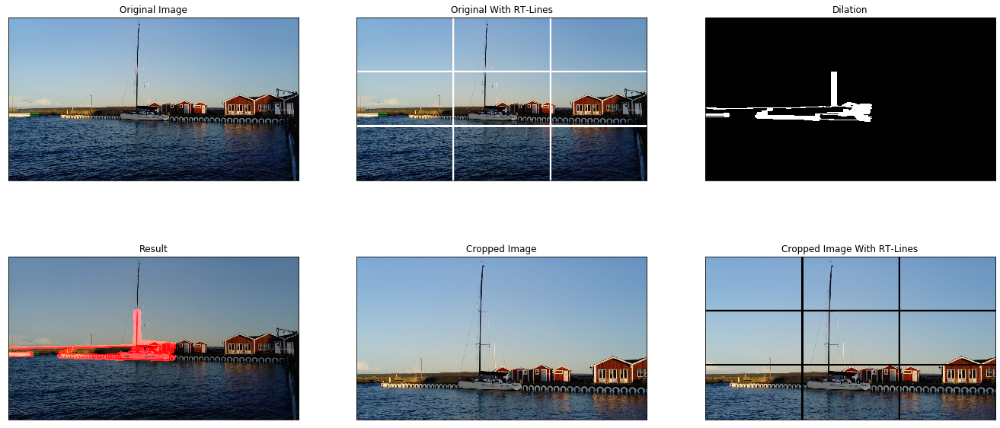

In [0]:
create_aesthetic_image_with_lines('IMGBoat.JPG')

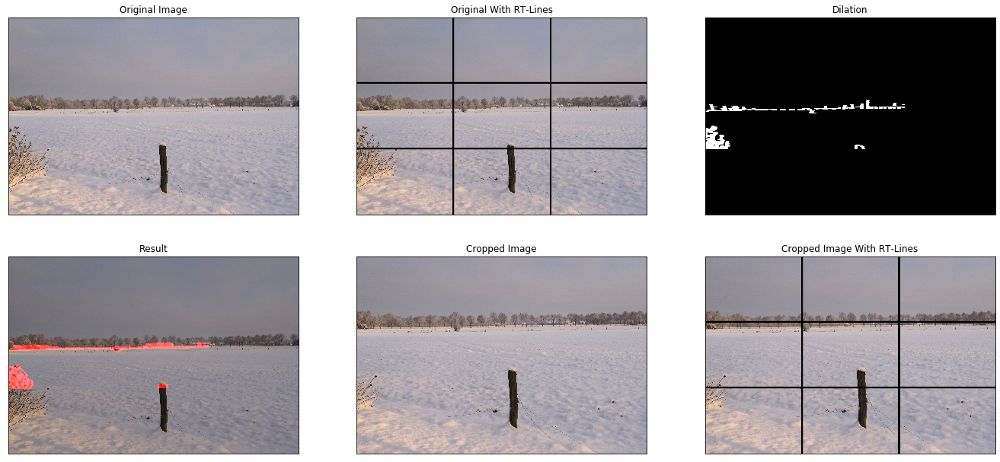

In [0]:
create_aesthetic_image_with_lines('Snow1.png')

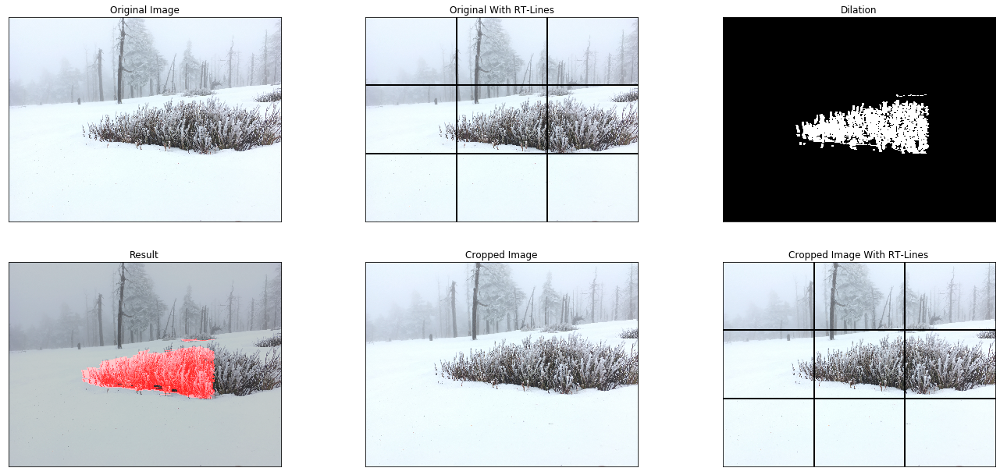

In [0]:
create_aesthetic_image_with_lines('IMGSnow2.JPG')

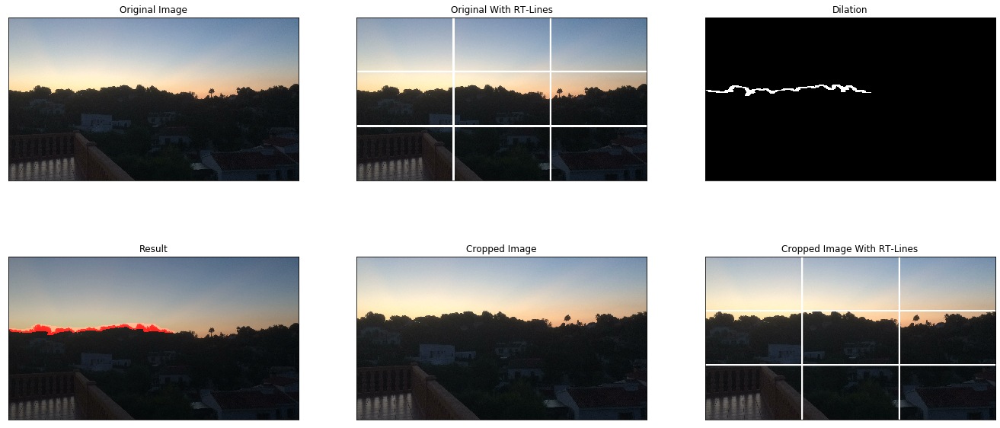

In [0]:
create_aesthetic_image_with_lines('IMGSpain1.JPG')

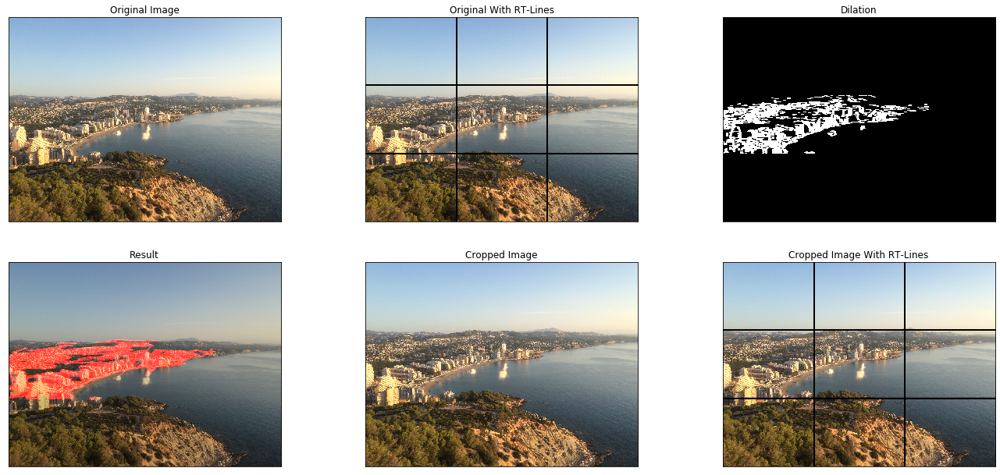

In [0]:
create_aesthetic_image_with_lines('IMGSpain2.JPG')

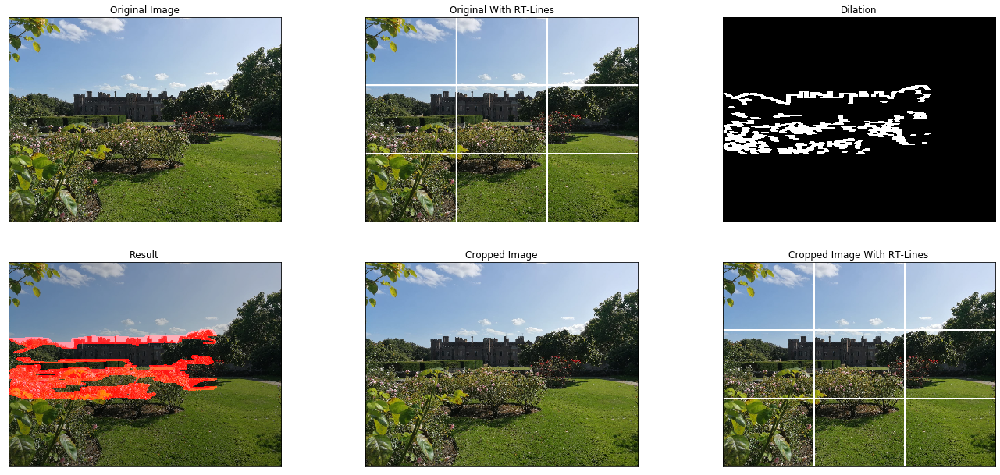

In [0]:
create_aesthetic_image_with_lines('IMGCastle.JPG')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:51: RuntimeWarning: divide by zero encountered in int_scalars


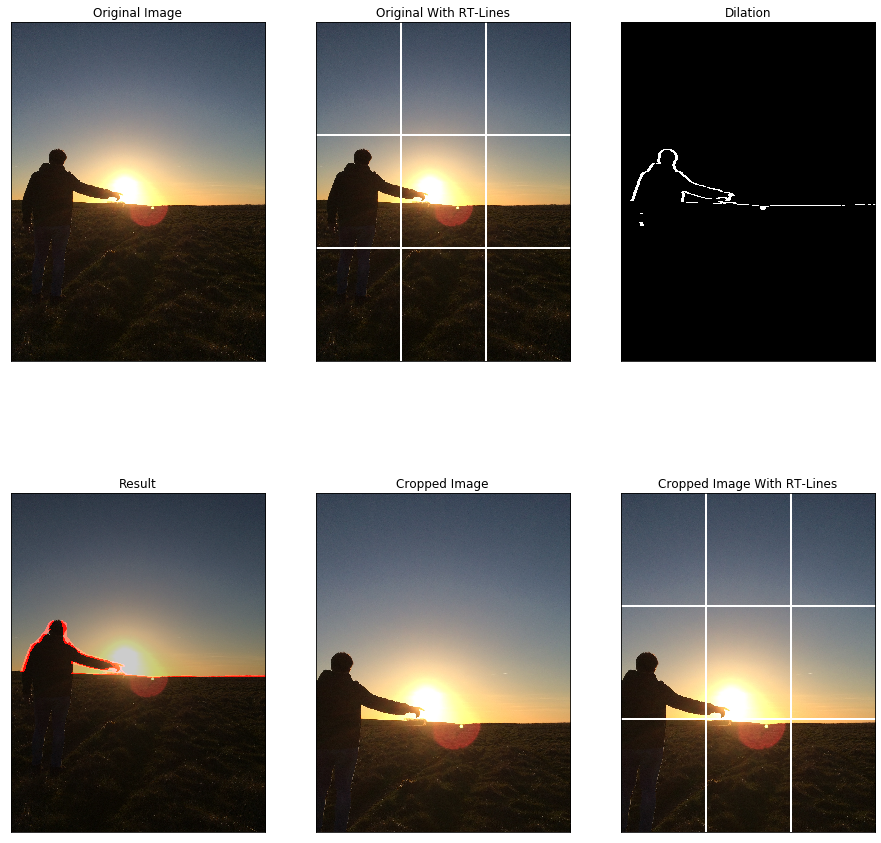

In [0]:
create_aesthetic_image_with_lines('IMGSun.JPG')

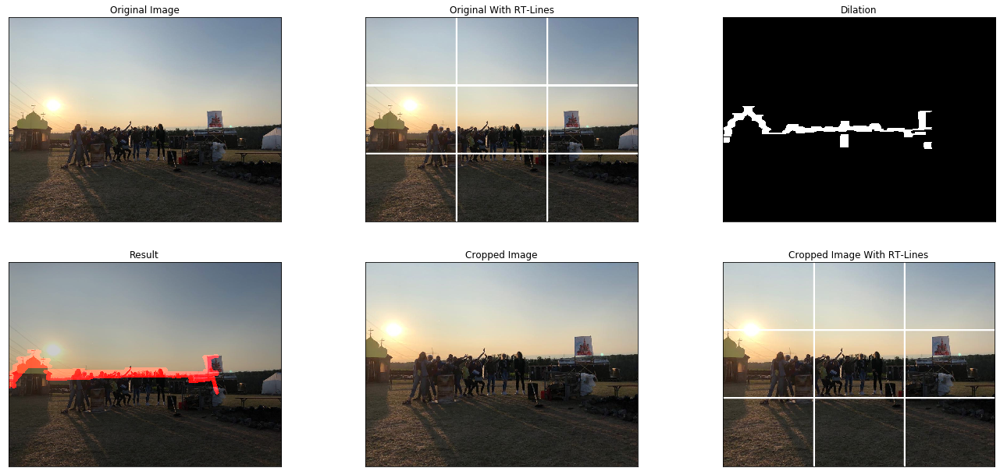

In [0]:
create_aesthetic_image_with_lines('IMGPeople.JPG')

###4.3 Salient Object Detection

Now we are able to make photos with horizontal lines more aesthetic. But everyone have photos of objects too. And the user should be able to make also these photo more aesthetic with our algorithm. 

To meet this aim, we first have to find the object in the image that has to be aligned -- as well as the lines in the previous chapter. Therefore we tested various approaches:
Our first approach was **Hough Circles Transformation** (see section 4.3.1) as we found this function during our researches on Hough Lines Transformations. But we noticed that not every object was round and not every object could be detected with this method. So we looked for other approaches and found the **saliency detection**:
> "In essence, saliency is what 'stands out' in a photo or scene, enabling your eye-brain connection to quickly (and essentially unconsciously) focus on the most important regions." (compare [Saliency Detection](https://www.pyimagesearch.com/2018/07/16/opencv-saliency-detection/))


![alt text](https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Saliency_Introduction.jpg)

This means that in the image 5 a) we as observers would recognize the flower in the middle of the branch as important (see picture 5 b). The saliency map in Figure 5 c) draws the areas in white where the important object is located according to the criteria of *colour, contrast and orientation*. As you can see here, exactly this flower was drawn in white. However, there was also a bit more that was recognized as **focus of attention** (short **FOA** that we as observers would not have designated as such. 

To implement the approach of saliency detection, we first used the functions of OpenCV. However, after some testing we found out that not all objects are recognized. So we ended up with an approach using **Convolutional Neural Networks** (short **CNN**). Due to the lack of time that went into the two previous approaches and the line recognition, we have not been able to create and train our own CNN. But fortunately we were provided with an already trained model: ***PoolNet*** (see [PoolNet](https://github.com/backseason/PoolNet)). 

In the following sections we describe the three approaches in detail.


####4.3.1 Detect Salient Objects - First Approach

In [0]:
def detect_object_with_cricles(img_name):
  img = load_image(img_name)
  output = img.copy()
  gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  median = cv2.medianBlur(gray, 5)

  circles = cv2.HoughCircles(median, cv2.HOUGH_GRADIENT, 0.9, 120, param1=50, 
                           param2=30, minRadius=0, maxRadius=0)

  detected_circles = np.uint16(np.around(circles))
  for i in circles[0,:]:
    #draw the outer circle
    img_circle = cv2.circle(img, (i[0], i[1]), i[2], (0, 255, 0), 10)
    #draw center of circle
    img_center = cv2.circle( img, (i[0], i[1]), 2, (0, 0, 255), 5)

  #img_circle = cv2.cvtColor(img_circle, cv2.COLOR_BGR2RGB)
  rt_circle = draw_rule_of_thirds(img_circle)

  titles = ['Grayscale Image', 'Image With Circles', 'Image With Circles and RT-Lines']
  images = [gray, img_circle, rt_circle]

  plot(images, titles)

Now we will test some sample images:

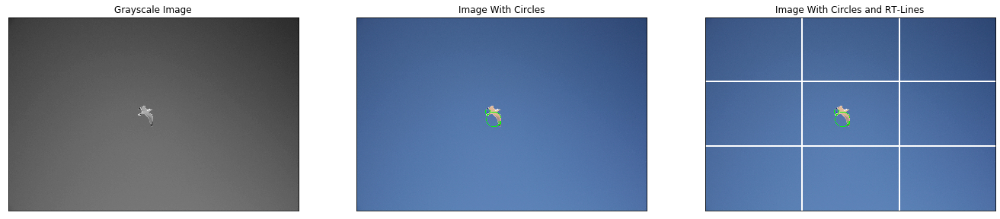

In [101]:
detect_object_with_cricles('moewe.JPG')

In this picture two circles were recognized, although the seagull actually does not represent or contain a circle. If the image would now be aligned to the center of the larger circle, the seagull would not be on the points of interest from the RT lines, because the centers of the circles are not on the seagull. 

Now let's look at a picture with a round object: 

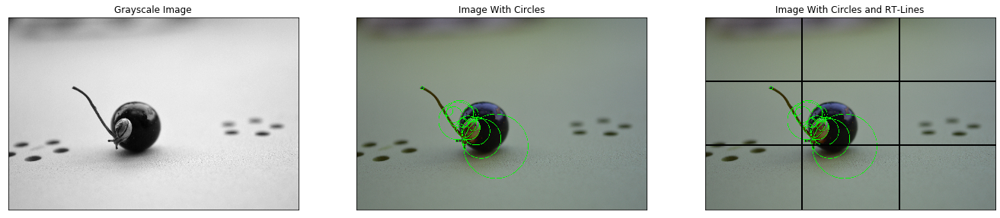

In [102]:
detect_object_with_cricles('snail.JPG')

Here the problem is particularly visible, because a lot of circles are detected. Now you would have to filter according to certain criteria for the circle containing the object to be aligned. But it is almost impossible to specify such criteria, because the object can be anywhere in the image. Unlike the horizon, which occurs only in certain regions of the image. That is why we switched to saliency detection.

####4.3.2 Detect Salient Objects - Second Approach

Our next approach was the salience detection using the features of OpenCV. Here we use the form of static saliency detection, because we only look at pictures and no videos where you would use motion saliency. There are two functions for static salience detection: On the one hand the ```StaticSaliencySpectralResidual``` and on the other hand the ```StaticSaliencyFineGrained```. (compare [OpenCV's Saliency Detection](https://www.pyimagesearch.com/2018/07/16/opencv-saliency-detection/))

In [0]:
def spectralResidualSaliency(img_name):
  img = load_image(img_name)
  # initialize OpenCV's static saliency spectral residual detector and compute 
  # the saliency map
  saliency = cv2.saliency.StaticSaliencySpectralResidual_create()
  (success, saliencyMap) = saliency.computeSaliency(img)

  saliencyMap = (saliencyMap * 255)
  # to get a binary map we threshold the saliency map
  threshMap = cv2.threshold(saliencyMap.astype("uint8"), 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]
  return img, saliencyMap, threshMap

In [0]:
def fineGrainedSaliency(img_name):
  img = load_image(img_name)
  # initialize OpenCV's static saliency fine grained detector and compute the saliency map
  saliencyFG = cv2.saliency.StaticSaliencyFineGrained_create()
  (success, saliencyMap) = saliencyFG.computeSaliency(img)

  saliencyMap = (saliencyMap * 255)
  # to get a binary map we threshold the saliency map
  threshMap = cv2.threshold(saliencyMap.astype("uint8"), 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]
  return img, saliencyMap, threshMap


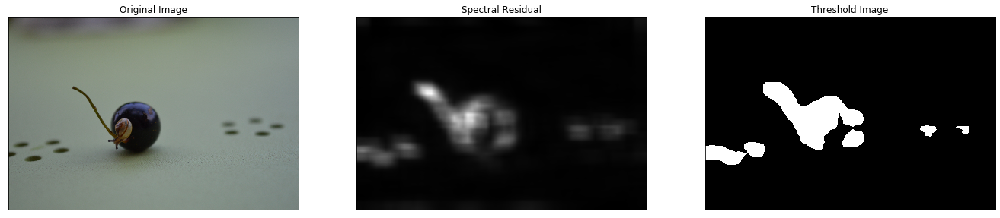

In [108]:
img, saliencyMap, threshMap = spectralResidualSaliency('snail.JPG')
#show images
titles = ['Original Image', 'Spectral Residual', 'Threshold Image']
images = [img, saliencyMap, threshMap]
plot(images, titles)

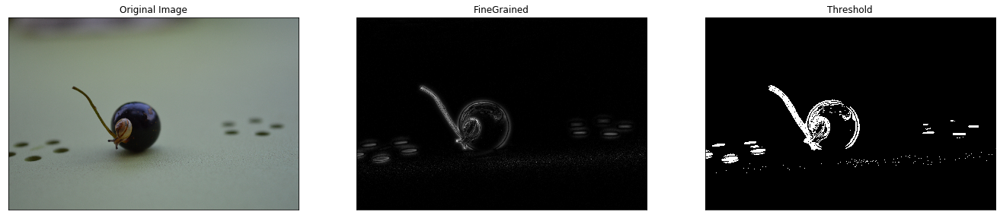

In [107]:
img, saliencyMap, threshMap = fineGrainedSaliency('snail.JPG')

#show images
titles = ['Original Image', 'FineGrained', 'Threshold Image']
images = [img, saliencyMap, threshMap]
plot(images, titles)

In [0]:
def calculate_centre_of_rectangle(box):
  # calculate the funktion of the diagonals of the rectangle
  m1 = (-box[0][1] + box[2][1])/(box[0][0] - box[2][0])
  b1 = -box[0][1] - (m1 * box[0][0])
  #f1 = m1*x + b1

  m2 = (-box[1][1] + box[3][1])/(box[1][0] - box[3][0])
  b2 = -box[1][1] - (m2 * box[1][0])
  #f2 = m2*x + b2

  # calculate the intersection of f1 and f2
  centre_x = int((b2 -b1)/(m1-m2))
  centre_y = int(-(m2 * centre_x + b2))
  #print('centre_x', centre_x)
  #print('centre_y', centre_y)
  return centre_x, centre_y

In [0]:
def find_salient_regions(img):
  img, saliencyMap, threshMap = spectralResidualSaliency(img)
  edges = cv2.Canny(threshMap,50,150,apertureSize = 3)
  kernel = np.ones((5,5),np.uint8)
  dilation = cv2.dilate(edges,kernel,iterations = 3)
  erosion = cv2.erode(dilation,kernel,iterations = 2)
  #plt.imshow(erosion, 'gray')
  contours, _ = cv2.findContours(erosion,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
  # Source: https://stackoverflow.com/questions/49577973/how-to-crop-the-biggest-object-in-image-with-python-opencv
  # Find object with the biggest bounding box
  mx_rect = (0,0,0,0)      # biggest skewed bounding box
  mx_area = 0
  for cont in contours:
      arect = cv2.minAreaRect(cont)
      area = arect[1][0]*arect[1][1]
      if area > mx_area:
          mx_rect, mx_area = arect, area

  img_empty = np.copy(img) * 0
  box = cv2.boxPoints(mx_rect)
  #print(box)
  box = np.int0(box)

  centre_x, centre_y = calculate_centre_of_rectangle(box)
  bounding_box = cv2.drawContours(img_empty,[box],0,(200,0,0),5)
  markers = cv2.circle(bounding_box, (centre_x, centre_y), 7, (0,255,0), 5)
  result = cv2.addWeighted(img, 1, markers, 1, 0)
  return img, box, centre_x, centre_y,saliencyMap, threshMap, result 

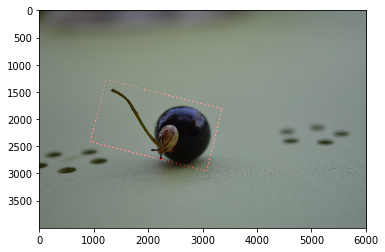

In [113]:
img, box, centre_x, centre_y, saliencyMap, threshMap, roi = find_salient_regions('snail.JPG')
plt.imshow(roi)

####4.3.3 Detect Salient Objects with PoolNet

####4.3.4 Crop the Image

####4.3.5 Application to other Images

##5. Limitations and Visions

##6. Reflections and Conclusions

##7. References

[1] https://matplotlib.org/api/_as_gen/matplotlib.axes.Axes.axhline.html